---

# Image generation
* dataset: [cat dataset](https://www.kaggle.com/datasets/crawford/cat-dataset)
* model: stylegan2

---

## 1) Import library

In [2]:
import os
import time
import copy
import pickle
import torch
import numpy as np
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, utils, datasets
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
import lmdb
from io import BytesIO
import warnings

# Custom imports
from functools import partial
import multiprocessing
from prepare_data import resize_worker
from train import data_sampler
from model import Generator
from model import *
from train import *

/opt/conda/lib/python3.10/site-packages/torch/utils/cpp_extension.py:1965: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torch/utils/cpp_extension.py:1965: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(


## 2) load custom data

### convert lmdb

In [3]:
def prepare(
    env, dataset, n_worker, sizes=(128, 256, 512, 1024), resample=Image.LANCZOS):
    resize_fn = partial(resize_worker, sizes=sizes, resample=resample)

    files = sorted(dataset.imgs, key=lambda x: x[0])
    files = [(i, file) for i, (file, label) in enumerate(files)]
    total = 0

    with multiprocessing.Pool(n_worker) as pool:
        for i, imgs in tqdm(pool.imap_unordered(resize_fn, files)):
            for size, img in zip(sizes, imgs):
                key = f"{size}-{str(i).zfill(5)}".encode("utf-8")

                with env.begin(write=True) as txn:
                    txn.put(key, img)

            total += 1

        with env.begin(write=True) as txn:
            txn.put("length".encode("utf-8"), str(total).encode("utf-8"))

In [4]:
output_lmdb = './cat_dataset/catdataset.lmdb'
sizes = (512,)  

input_dir = './cat_dataset/cats'
dataset = datasets.ImageFolder(input_dir)

# Convert LMDB
with lmdb.open(output_lmdb, map_size=1024**4, readahead=False) as env:
    prepare(env, dataset, n_worker=4, sizes=sizes, resample=Image.LANCZOS)

print("The LMDB conversion is complete!")

9997it [01:33, 107.05it/s]


The LMDB conversion is complete!


### load data & set config

In [5]:
class MultiResolutionDataset2(Dataset):
    def __init__(self, path, transform, resolution=512):
        self.env = lmdb.open(
            path,
            max_readers=32,
            readonly=True,
            lock=False,
            readahead=False,
            meminit=False,
        )

        if not self.env:
            raise IOError('Cannot open lmdb dataset', path)

        with self.env.begin(write=False) as txn:
            self.length = int(txn.get('length'.encode('utf-8')).decode('utf-8'))

        self.resolution = resolution
        self.transform = transform

    def __len__(self):
        return self.length

    def __getitem__(self, index):
        with self.env.begin(write=False) as txn:
            key = f'{self.resolution}-{str(index).zfill(5)}'.encode('utf-8')
            img_bytes = txn.get(key)

        buffer = BytesIO(img_bytes)
        img = Image.open(buffer)
        img = self.transform(img)

        return img

In [6]:
class Config:
    size = 512
    latent = 512
    n_mlp = 8
    channel_multiplier = 2
    lr = 0.002
    batch = 1
    g_reg_every = 4
    d_reg_every = 16
    path = "./cat_dataset/catdataset.lmdb"  
    distributed = False

model_config = Config()

In [7]:
transform = transforms.Compose(
    [
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5), inplace=True),
    ]
)

dataset = MultiResolutionDataset2(model_config.path, transform, model_config.size)
loader = DataLoader(dataset, batch_size=model_config.batch, 
                    sampler=data_sampler(dataset, shuffle=True, distributed=model_config.distributed),drop_last=True)

print(f"Dataset contains {len(dataset)} images.")

Dataset contains 9997 images.


## 3) define funtion for generator and discriminator, Initialization

In [9]:
class Generator(nn.Module):
    def __init__(self, size, style_dim, n_mlp, channel_multiplier=2, blur_kernel=[1, 3, 3, 1], lr_mlp=0.01):
        super().__init__()

        self.size = size
        self.style_dim = style_dim

        layers = [PixelNorm()]

        for i in range(n_mlp):
            layers.append(EqualLinear(style_dim, style_dim, lr_mul=lr_mlp, activation="fused_lrelu"))

        self.style = nn.Sequential(*layers)

        self.channels = {
            4: 512,
            8: 512,
            16: 512,
            32: 512,
            64: 256 * channel_multiplier,
            128: 128 * channel_multiplier,
            256: 64 * channel_multiplier,
            512: 32 * channel_multiplier,
            1024: 16 * channel_multiplier,
        }

        self.input = ConstantInput(self.channels[4])
        self.conv1 = StyledConv(self.channels[4], self.channels[4], 3, style_dim, blur_kernel=blur_kernel)
        self.to_rgb1 = ToRGB(self.channels[4], style_dim, upsample=False)

        self.log_size = int(math.log(size, 2))
        self.num_layers = (self.log_size - 2) * 2 + 1

        self.convs = nn.ModuleList()
        self.upsamples = nn.ModuleList()
        self.to_rgbs = nn.ModuleList()
        self.noises = nn.Module()

        in_channel = self.channels[4]

        for layer_idx in range(self.num_layers):
            res = (layer_idx + 5) // 2
            shape = [1, 1, 2 ** res, 2 ** res]
            self.noises.register_buffer(f"noise_{layer_idx}", torch.randn(*shape))

        for i in range(3, self.log_size + 1):
            out_channel = self.channels[2 ** i]

            self.convs.append(StyledConv(in_channel, out_channel, 3, style_dim, upsample=True, blur_kernel=blur_kernel))
            self.convs.append(StyledConv(out_channel, out_channel, 3, style_dim, blur_kernel=blur_kernel))
            self.to_rgbs.append(ToRGB(out_channel, style_dim))

            in_channel = out_channel

        self.n_latent = self.log_size * 2 - 2

    def make_noise(self):
        device = self.input.input.device

        noises = [torch.randn(1, 1, 2 ** 2, 2 ** 2, device=device)]

        for i in range(3, self.log_size + 1):
            for _ in range(2):
                noises.append(torch.randn(1, 1, 2 ** i, 2 ** i, device=device))

        return noises

    def mean_latent(self, n_latent):
        latent_in = torch.randn(
            n_latent, self.style_dim, device=self.input.input.device
        )
        latent = self.style(latent_in).mean(0, keepdim=True)

        return latent

    def get_latent(self, input):
        return self.style(input)

    def forward(self, styles, return_latents=False, inject_index=None, truncation=1, truncation_latent=None,
            input_is_latent=False, noise=None, randomize_noise=True):
        if not input_is_latent:
            styles = [self.style(s) for s in styles]

        if noise is None:
            if randomize_noise:
                noise = [None] * self.num_layers
            else:
                noise = [getattr(self.noises, f"noise_{i}") for i in range(self.num_layers) ]

        if truncation < 1:
            style_t = []

            for style in styles:
                style_t.append(truncation_latent + truncation * (style - truncation_latent))

            styles = style_t

        if len(styles) < 2:
            inject_index = self.n_latent

            if styles[0].ndim < 3:
                latent = styles[0].unsqueeze(1).repeat(1, inject_index, 1)

            else:
                latent = styles[0]

        else:
            if inject_index is None:
                inject_index = random.randint(1, self.n_latent - 1)

            latent = styles[0].unsqueeze(1).repeat(1, inject_index, 1)
            latent2 = styles[1].unsqueeze(1).repeat(1, self.n_latent - inject_index, 1)

            latent = torch.cat([latent, latent2], 1)

        out = self.input(latent)
        out = self.conv1(out, latent[:, 0], noise=noise[0])

        skip = self.to_rgb1(out, latent[:, 1])

        i = 1
        for conv1, conv2, noise1, noise2, to_rgb in zip(
            self.convs[::2], self.convs[1::2], noise[1::2], noise[2::2], self.to_rgbs):
            out = conv1(out, latent[:, i], noise=noise1)
            out = conv2(out, latent[:, i + 1], noise=noise2)
            skip = to_rgb(out, latent[:, i + 2], skip)

            i += 2

        image = skip

        if return_latents:
            return image, latent

        else:
            return image, None

In [10]:
class Discriminator(nn.Module):
    def __init__(self, size, channel_multiplier=2, blur_kernel=[1, 3, 3, 1]):
        super().__init__()

        channels = {
            4: 512,
            8: 512,
            16: 512,
            32: 512,
            64: 256 * channel_multiplier,
            128: 128 * channel_multiplier,
            256: 64 * channel_multiplier,
            512: 32 * channel_multiplier,
            1024: 16 * channel_multiplier,
        }

        convs = [ConvLayer(3, channels[size], 1)]
        log_size = int(math.log(size, 2))
        in_channel = channels[size]

        for i in range(log_size, 2, -1):
            out_channel = channels[2 ** (i - 1)]
            convs.append(ResBlock(in_channel, out_channel, blur_kernel))
            in_channel = out_channel

        self.convs = nn.Sequential(*convs)

        self.stddev_group = 4
        self.stddev_feat = 1

        self.final_conv = ConvLayer(in_channel + 1, channels[4], 3)
        self.final_linear = nn.Sequential(
            EqualLinear(channels[4] * 4 * 4, channels[4], activation="fused_lrelu"),
            EqualLinear(channels[4], 1))

    def forward(self, input):
        out = self.convs(input)

        batch, channel, height, width = out.shape
        group = min(batch, self.stddev_group)
        stddev = out.view(
            group, -1, self.stddev_feat, channel // self.stddev_feat, height, width
        )
        stddev = torch.sqrt(stddev.var(0, unbiased=False) + 1e-8)
        stddev = stddev.mean([2, 3, 4], keepdims=True).squeeze(2)
        stddev = stddev.repeat(group, 1, height, width)
        out = torch.cat([out, stddev], 1)

        out = self.final_conv(out)

        out = out.view(batch, -1)
        out = self.final_linear(out)

        return out

### Initialization

In [11]:
device = "cuda"

generator = Generator( model_config.size, model_config.latent, model_config.n_mlp, channel_multiplier=model_config.channel_multiplier).to(device)
discriminator = Discriminator(model_config.size, channel_multiplier=model_config.channel_multiplier).to(device)

g_ema = Generator(model_config.size, model_config.latent, model_config.n_mlp, channel_multiplier=model_config.channel_multiplier).to(device)
g_ema.eval()

accumulate(g_ema, generator, 0)

In [12]:
g_reg_ratio = model_config.g_reg_every / (model_config.g_reg_every + 1)
d_reg_ratio = model_config.d_reg_every / (model_config.d_reg_every + 1)

g_optim = optim.Adam(generator.parameters(),
    lr=model_config.lr * g_reg_ratio, betas=(0 ** g_reg_ratio, 0.99 ** g_reg_ratio))

d_optim = optim.Adam(discriminator.parameters(),
    lr=model_config.lr * d_reg_ratio, betas=(0 ** d_reg_ratio, 0.99 ** d_reg_ratio))

### test

In [13]:
z = torch.randn(1, 512).to(device) 
c = torch.zeros(1, 0).to(device)        

img,_ = generator([z])
print("Generated Image Shape:", img.shape)  

real_score = discriminator(img)
print("Discriminator Output:", real_score)

/kaggle/working/stylegan2-pytorch/op/conv2d_gradfix.py:88: UserWarning: conv2d_gradfix not supported on PyTorch 2.4.0. Falling back to torch.nn.functional.conv2d().
  warnings.warn(


Generated Image Shape: torch.Size([1, 3, 512, 512])
Discriminator Output: tensor([[0.7373]], device='cuda:0', grad_fn=<AddmmBackward0>)


## 4) Train model

In [14]:
def train(args, loader, generator, discriminator, g_optim, d_optim, g_ema, device):
    if args.resume:
        checkpoint_path = args.resume  
        checkpoint = torch.load(checkpoint_path, map_location=device)
        
        g_ema.load_state_dict(checkpoint['g_ema'], strict=False)
        generator = Generator(size=512, style_dim=512, n_mlp=8, channel_multiplier=2).to(device)
        generator.load_state_dict(checkpoint['g_ema'], strict=False)
        
        if 'd' in checkpoint:
            discriminator.load_state_dict(checkpoint['d'], strict=False)
        
        if 'g_optim' in checkpoint:
            g_optim.load_state_dict(checkpoint['g_optim'])
        if 'd_optim' in checkpoint:
            d_optim.load_state_dict(checkpoint['d_optim'])
        
        print("Resuming from checkpoint...")

    loader = sample_data(loader)

    pbar = range(args.iter)

    mean_path_length = 0
    d_loss_val = 0
    r1_loss = torch.tensor(0.0, device=device)
    g_loss_val = 0
    path_loss = torch.tensor(0.0, device=device)
    path_lengths = torch.tensor(0.0, device=device)
    mean_path_length_avg = 0
    loss_dict = {}

    if args.distributed:
        g_module = generator.module
        d_module = discriminator.module
    else:
        g_module = generator
        d_module = discriminator

    accum = 0.5 ** (32 / (10 * 1000))
    ada_aug_p = args.augment_p if args.augment_p > 0 else 0.0
    r_t_stat = 0

    if args.augment and args.augment_p == 0:
        ada_augment = AdaptiveAugment(args.ada_target, args.ada_length, 8, device)

    sample_z = torch.randn(args.n_sample, args.latent, device=device)

    for idx in pbar:
        i = idx + args.start_iter

        if i > args.iter:
            print("Done!")
            break

        real_img = next(loader)
        real_img = real_img.to(device)

        requires_grad(generator, False)
        requires_grad(discriminator, True)

        noise = mixing_noise(args.batch, args.latent, args.mixing, device)
        fake_img, _ = generator(noise)

        if args.augment:
            real_img_aug, _ = augment(real_img, ada_aug_p)
            fake_img, _ = augment(fake_img, ada_aug_p)
        else:
            real_img_aug = real_img

        fake_pred = discriminator(fake_img)
        real_pred = discriminator(real_img_aug)
        d_loss = d_logistic_loss(real_pred, fake_pred)

        loss_dict["d"] = d_loss
        loss_dict["real_score"] = real_pred.mean()
        loss_dict["fake_score"] = fake_pred.mean()

        discriminator.zero_grad()
        d_loss.backward()
        d_optim.step()

        if args.augment and args.augment_p == 0:
            ada_aug_p = ada_augment.tune(real_pred)
            r_t_stat = ada_augment.r_t_stat

        d_regularize = i % args.d_reg_every == 0

        if d_regularize:
            real_img.requires_grad = True

            if args.augment:
                real_img_aug, _ = augment(real_img, ada_aug_p)
            else:
                real_img_aug = real_img

            real_pred = discriminator(real_img_aug)
            r1_loss = d_r1_loss(real_pred, real_img)

            discriminator.zero_grad()
            (args.r1 / 2 * r1_loss * args.d_reg_every + 0 * real_pred[0]).backward()

            d_optim.step()

        loss_dict["r1"] = r1_loss

        requires_grad(generator, True)
        requires_grad(discriminator, False)

        noise = mixing_noise(args.batch, args.latent, args.mixing, device)
        fake_img, _ = generator(noise)

        if args.augment:
            fake_img, _ = augment(fake_img, ada_aug_p)

        fake_pred = discriminator(fake_img)
        g_loss = g_nonsaturating_loss(fake_pred)

        loss_dict["g"] = g_loss

        generator.zero_grad()
        g_loss.backward()
        g_optim.step()

        g_regularize = i % args.g_reg_every == 0

        if g_regularize:
            path_batch_size = max(1, args.batch // args.path_batch_shrink)
            noise = mixing_noise(path_batch_size, args.latent, args.mixing, device)
            fake_img, latents = generator(noise, return_latents=True)

            path_loss, mean_path_length, path_lengths = g_path_regularize(
                fake_img, latents, mean_path_length
            )

            generator.zero_grad()
            weighted_path_loss = args.path_regularize * args.g_reg_every * path_loss

            if args.path_batch_shrink:
                weighted_path_loss += 0 * fake_img[0, 0, 0, 0]

            weighted_path_loss.backward()

            g_optim.step()

            mean_path_length_avg = (
                reduce_sum(mean_path_length).item() / get_world_size()
            )

        loss_dict["path"] = path_loss
        loss_dict["path_length"] = path_lengths.mean()

        accumulate(g_ema, g_module, accum)

        loss_reduced = reduce_loss_dict(loss_dict)

        d_loss_val = loss_reduced["d"].mean().item()
        g_loss_val = loss_reduced["g"].mean().item()
        r1_val = loss_reduced["r1"].mean().item()
        path_loss_val = loss_reduced["path"].mean().item()
        real_score_val = loss_reduced["real_score"].mean().item()
        fake_score_val = loss_reduced["fake_score"].mean().item()
        path_length_val = loss_reduced["path_length"].mean().item()

        if i % 100 == 0:
            print(
                f"Step {i}: "
                f"Discriminator Loss: {d_loss_val:.4f}, "
                f"Generator Loss: {g_loss_val:.4f}, "
                f"R1 Loss: {r1_val:.4f}, "
                f"Path Loss: {path_loss_val:.4f}, "
                f"Mean Path Length: {mean_path_length_avg:.4f}"
            )
        
            if i % 100 == 0:
                with torch.no_grad():
                    g_ema.eval()
                    sample, _ = g_ema([sample_z])
                    utils.save_image(
                        sample,
                        f"sample/{str(i).zfill(6)}.png",
                        nrow=int(args.n_sample ** 0.5),
                        normalize=True
                    )

            if i % 100 == 0:
                checkpoint_path = f"checkpoint/{str(i).zfill(6)}.pt"
                print(f"Saving checkpoint to: {checkpoint_path}")
                torch.save(
                    {
                        "g_ema": g_ema.state_dict(),
                        "d": d_module.state_dict(),
                        "args": args,
                        "ada_aug_p": ada_aug_p,
                    },
                    checkpoint_path,
                )


In [15]:
class Config:
    def __init__(self):
        self.size = 512  
        self.latent = 512  
        self.n_mlp = 8
        self.channel_multiplier = 2
        self.lr = 0.002
        self.batch = 2
        self.g_reg_every = 4
        self.d_reg_every = 16
        self.iter = 1000  
        self.start_iter = 0
        self.path = "./cat_dataset/catdataset.lmdb"  
        self.resume = "./pretrain_model/custom_cat_model.pt"  
        self.distributed = False
        self.n_sample = 10
        self.augment_p=0
        self.augment=False
        self.mixing=0.9
        self.r1=10
        self.path_batch_shrink=2
        self.path_regularize=2
        self.wandb=None
        self.pics=20
        self.sample=1
        self.truncation=4096

train_config = Config()

In [16]:
train(train_config, loader, generator, discriminator, g_optim, d_optim, g_ema, device)

/tmp/ipykernel_3775/2009124673.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=device)


Resuming from checkpoint...
Step 0: Discriminator Loss: 1.3414, Generator Loss: 1.8812, R1 Loss: 0.0000, Path Loss: 0.3632, Mean Path Length: 0.0061
Saving checkpoint to: checkpoint/000000.pt
Step 100: Discriminator Loss: 1.6258, Generator Loss: 0.5962, R1 Loss: 0.0000, Path Loss: 0.2691, Mean Path Length: 0.1083
Saving checkpoint to: checkpoint/000100.pt
Step 200: Discriminator Loss: 1.2723, Generator Loss: 0.4696, R1 Loss: 0.0000, Path Loss: 0.0226, Mean Path Length: 0.1879
Saving checkpoint to: checkpoint/000200.pt
Step 300: Discriminator Loss: 1.3474, Generator Loss: 0.6972, R1 Loss: 0.0000, Path Loss: 0.0024, Mean Path Length: 0.2469
Saving checkpoint to: checkpoint/000300.pt
Step 400: Discriminator Loss: 1.3355, Generator Loss: 0.5564, R1 Loss: 0.0000, Path Loss: 0.0052, Mean Path Length: 0.3106
Saving checkpoint to: checkpoint/000400.pt
Step 500: Discriminator Loss: 1.4523, Generator Loss: 0.7781, R1 Loss: 0.0000, Path Loss: 0.0009, Mean Path Length: 0.3308
Saving checkpoint to:

## 5) Generate Image

/tmp/ipykernel_3775/2289751315.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(ckpt, map_location=device)
  0%|          | 0/20 [00:00<?, ?it/s]

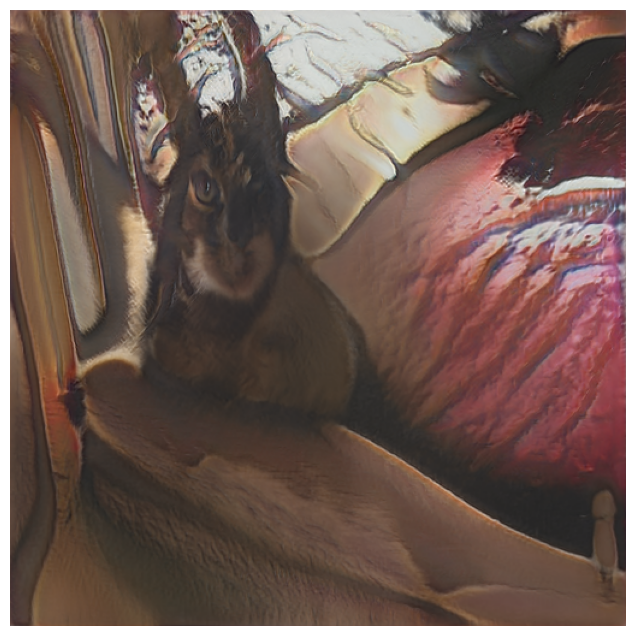

  5%|▌         | 1/20 [00:00<00:12,  1.56it/s]

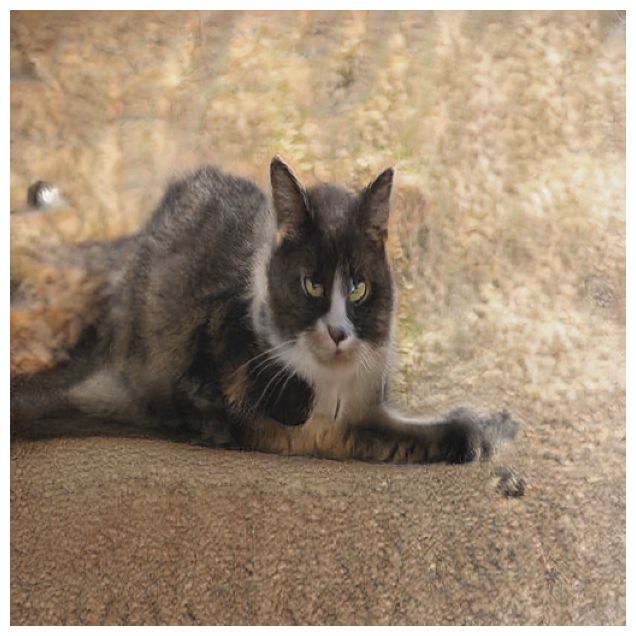

 10%|█         | 2/20 [00:01<00:11,  1.58it/s]

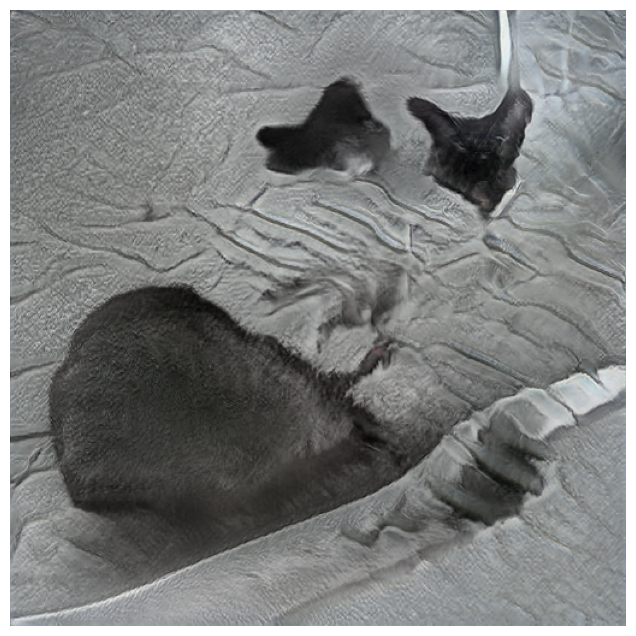

 15%|█▌        | 3/20 [00:01<00:10,  1.69it/s]

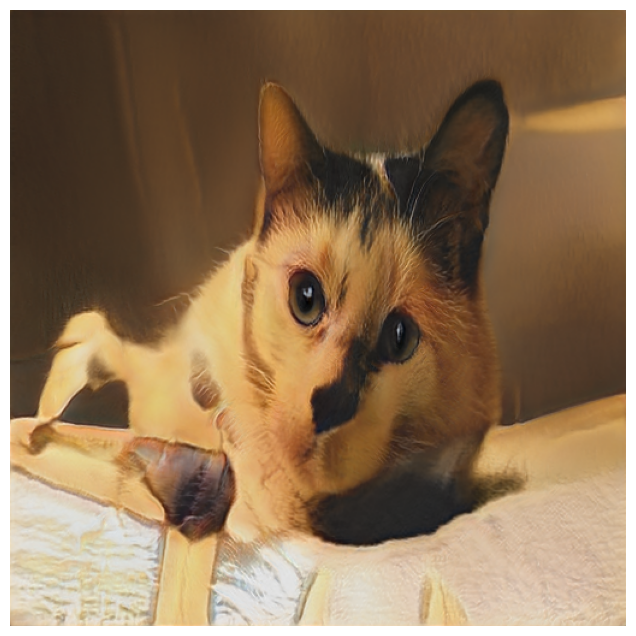

 20%|██        | 4/20 [00:02<00:09,  1.69it/s]

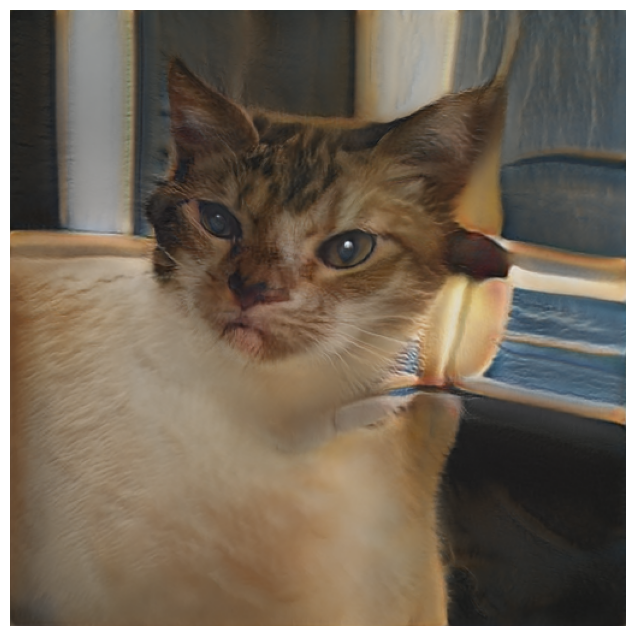

 25%|██▌       | 5/20 [00:03<00:09,  1.66it/s]

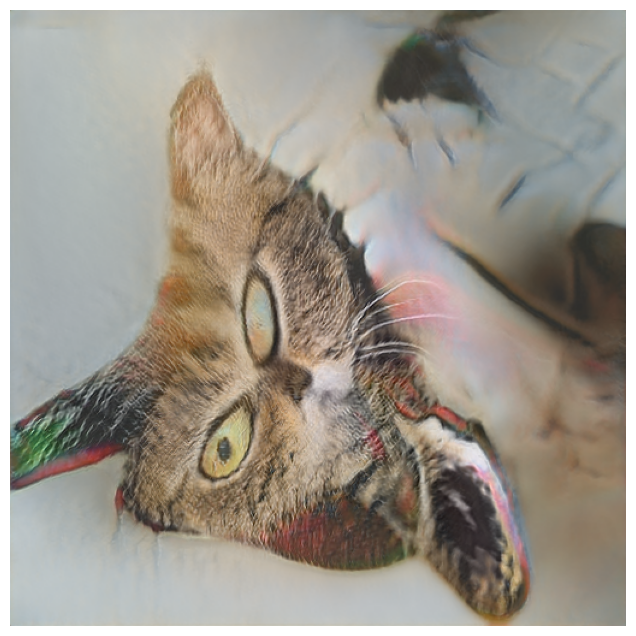

 30%|███       | 6/20 [00:03<00:08,  1.70it/s]

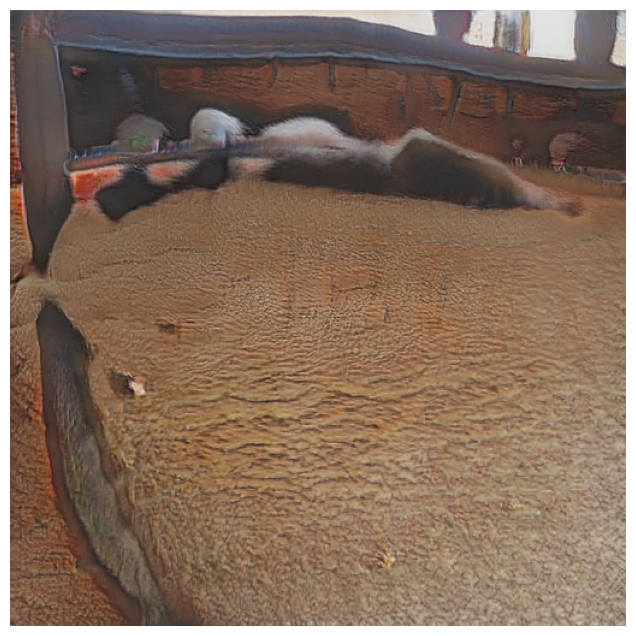

 35%|███▌      | 7/20 [00:04<00:07,  1.71it/s]

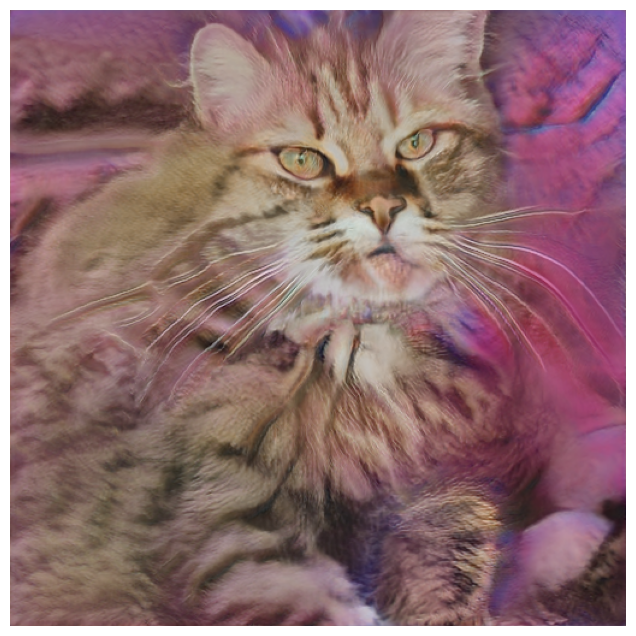

 40%|████      | 8/20 [00:04<00:07,  1.66it/s]

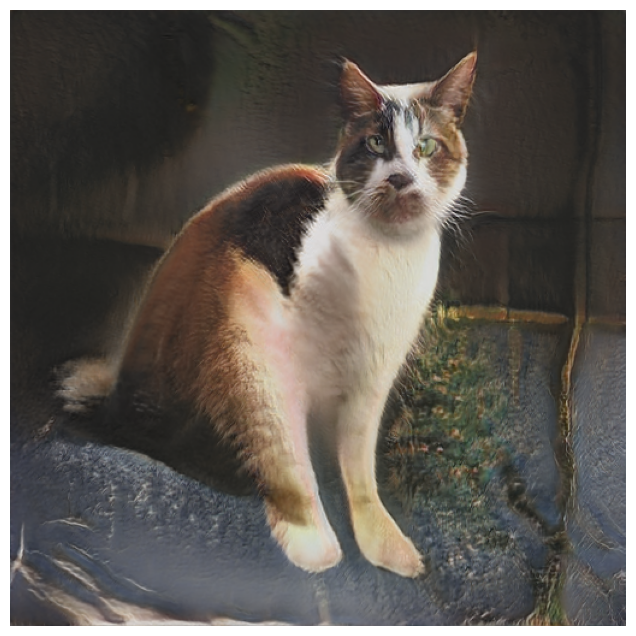

 45%|████▌     | 9/20 [00:05<00:06,  1.67it/s]

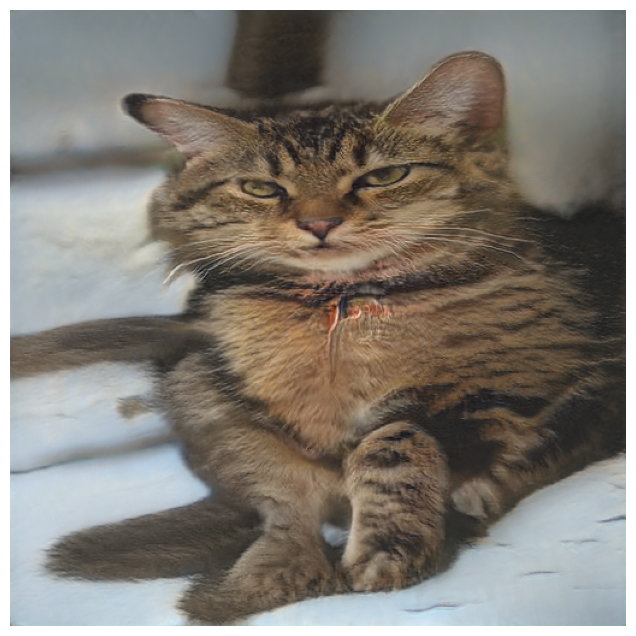

 50%|█████     | 10/20 [00:05<00:05,  1.70it/s]

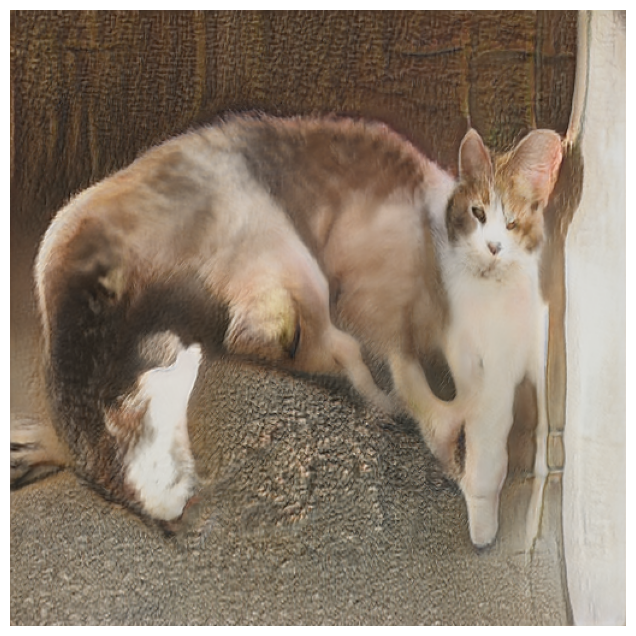

 55%|█████▌    | 11/20 [00:06<00:05,  1.74it/s]

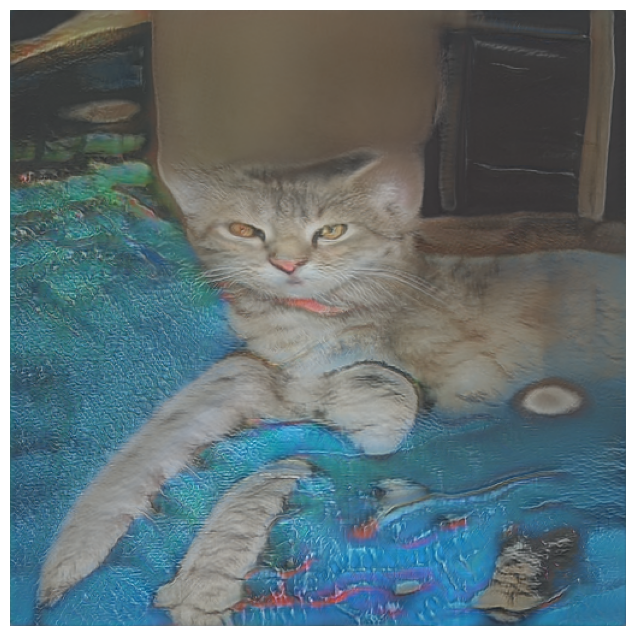

 60%|██████    | 12/20 [00:06<00:04,  1.82it/s]

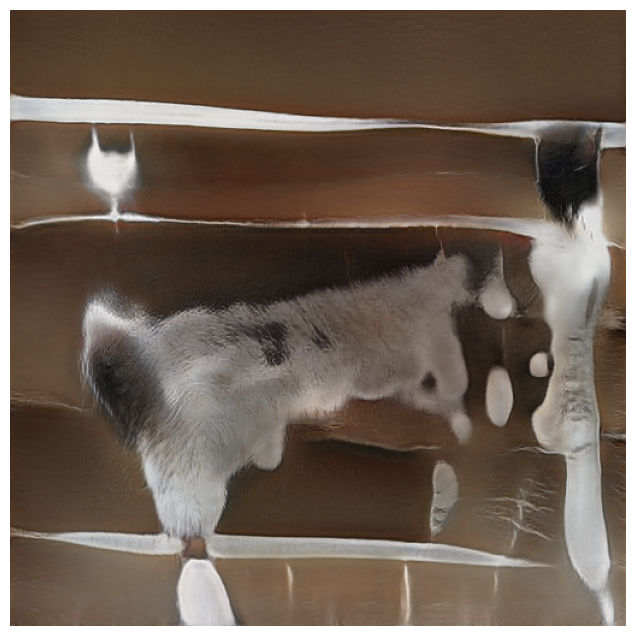

 65%|██████▌   | 13/20 [00:07<00:03,  1.76it/s]

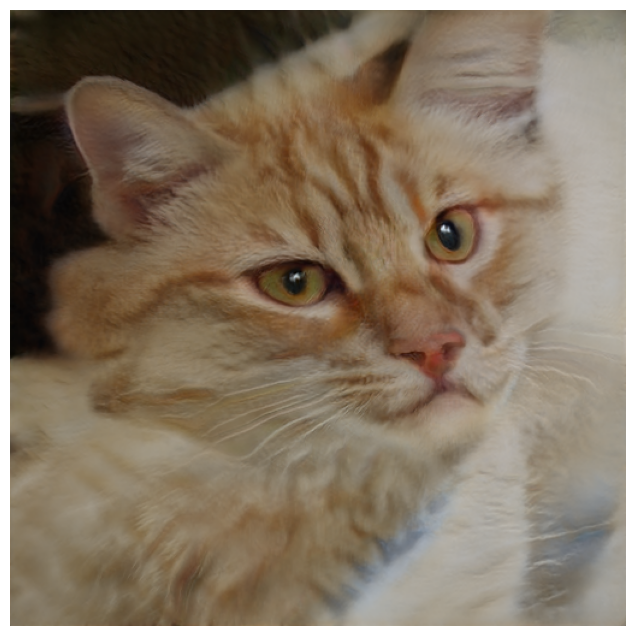

 70%|███████   | 14/20 [00:08<00:03,  1.73it/s]

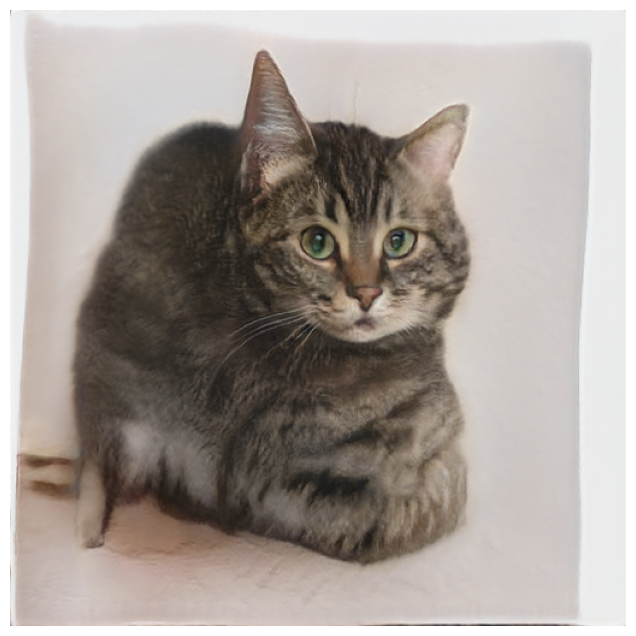

 75%|███████▌  | 15/20 [00:08<00:02,  1.81it/s]

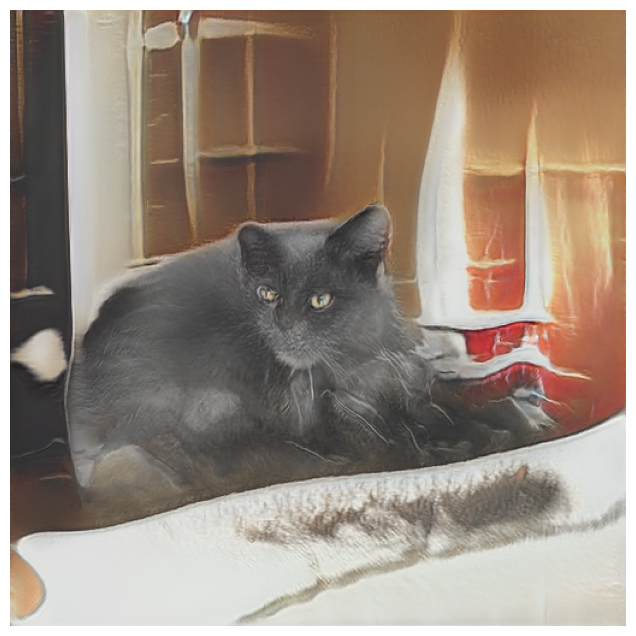

 80%|████████  | 16/20 [00:09<00:02,  1.85it/s]

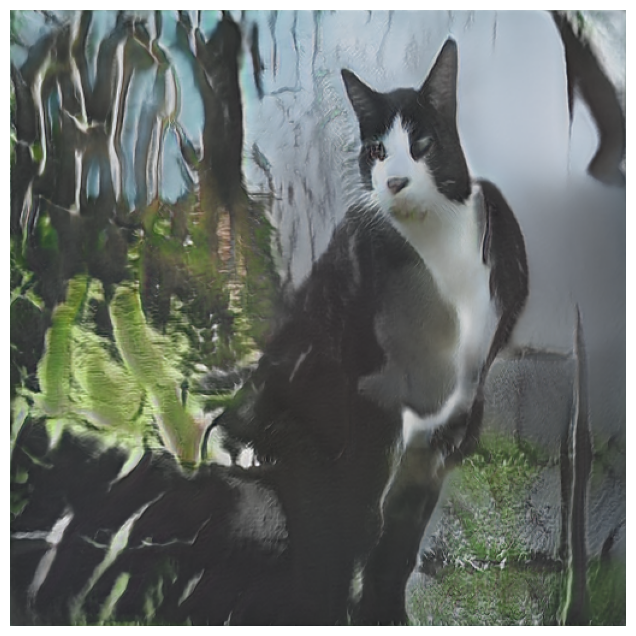

 85%|████████▌ | 17/20 [00:09<00:01,  1.83it/s]

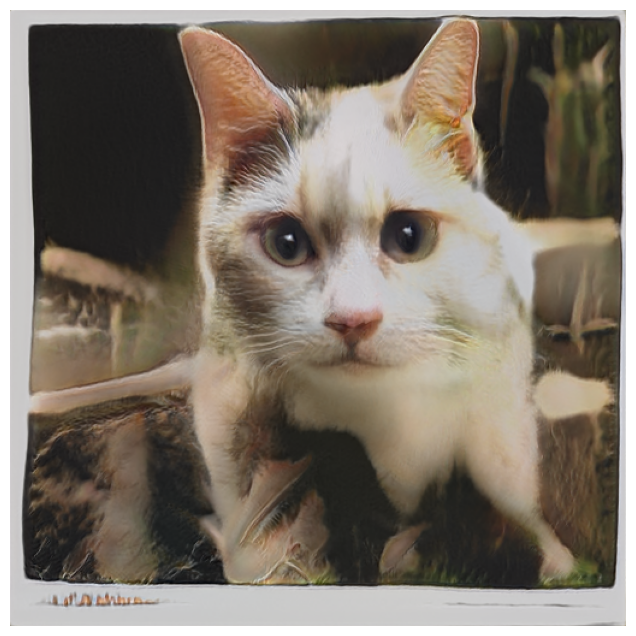

 90%|█████████ | 18/20 [00:10<00:01,  1.73it/s]

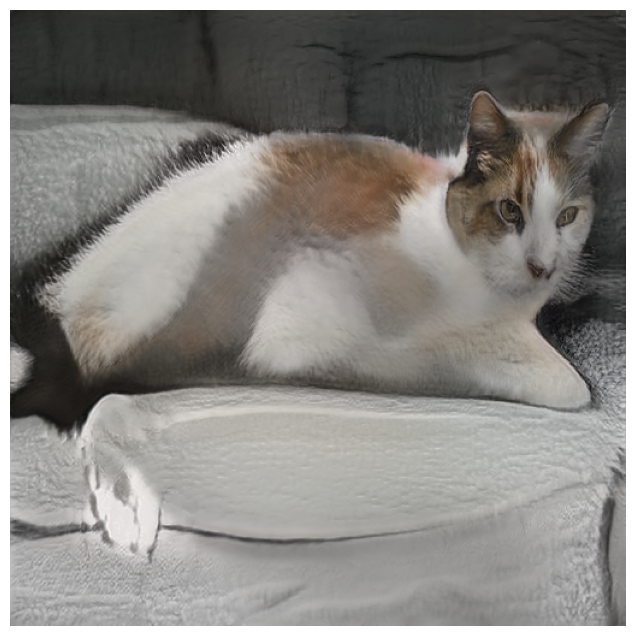

 95%|█████████▌| 19/20 [00:10<00:00,  1.76it/s]

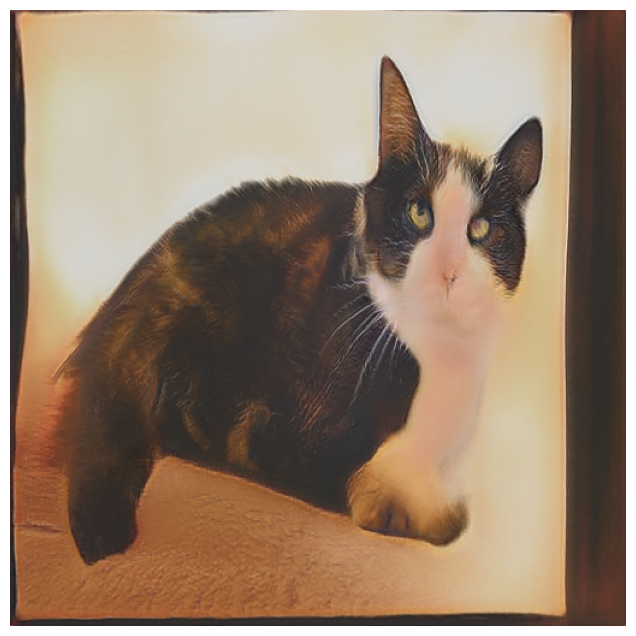

100%|██████████| 20/20 [00:11<00:00,  1.74it/s]


In [17]:
def generate_images(train_config, g_ema, device, mean_latent):

    with torch.no_grad():
        g_ema.eval()
        for i in tqdm(range(train_config.pics)):
            sample_z = torch.randn(train_config.sample, train_config.latent, device=device)
            sample, _ = g_ema(
                [sample_z], truncation=train_config.truncation, truncation_latent=mean_latent)

            plt.figure(figsize=(8, 8))
            utils.save_image(sample, f"temp_image.png", nrow=1, normalize=True)
            img = plt.imread("temp_image.png")  # Read image
            plt.imshow(img)  # Display image
            plt.axis('off')  # Turn off axis
            plt.show()


ckpt = "./checkpoint/000900.pt"
g_ema = Generator(
    train_config.size, train_config.latent, n_mlp=8, channel_multiplier=train_config.channel_multiplier).to(device)

checkpoint = torch.load(ckpt, map_location=device)
g_ema.load_state_dict(checkpoint['g_ema'], strict=False)

generate_images(train_config, g_ema, device, mean_latent=None)
